# Transformer

- Transformer is a neural network architecture based on attention principle.
- The main motive behind transformer is to overcome the drawbacks of sequential neural networks (Reccurrent Neural Networks (RNN)).
- Transformer can overcome the time dependency in sequential computation approach and long term dependency issues (hidden state mostly influenced by recent tockens) in long sequences through the Self Attention Principle.
- it's ability to parallelize computations can enable training and inference more faster.

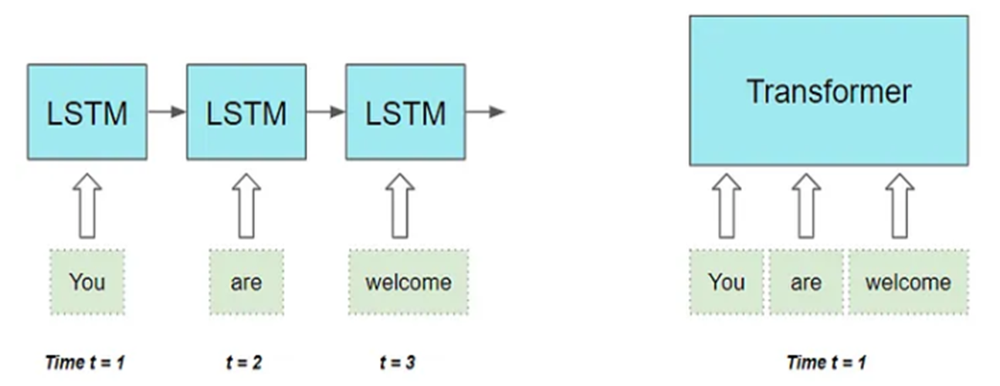


- The Transformer was first proposed in the paper 'Attention all you need' (https://proceedings.neurips.cc/paper_files/paper/2017/file/3f5ee243547dee91fbd053c1c4a845aa-Paper.pdf).
- Transformers consist of a set of encoders and decoders.
- Each encoder consists of a self attention layer and a feed forward neural network.
- Each decoder consists of a self attention layer with masking, encoding- decoding cross attention layer and a feed forward neural network.
- Residual connection and normalization are added to both encoder and decoder for better and faster training.


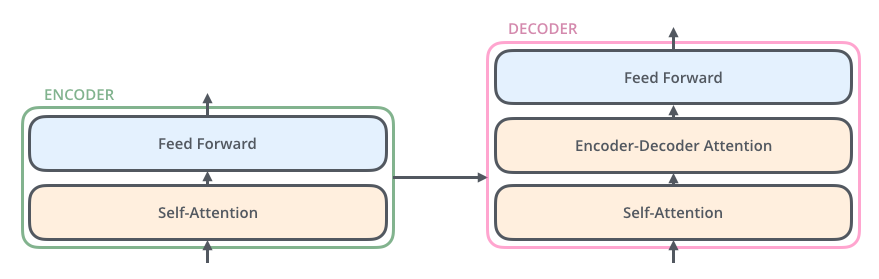


### Self Attention

- Self attention allow the inputs to interact each other to find out which among them should get more attention.
- Self attention enabels transformer to capture the relationship between different positions in the input sequence.
 - While encoding a particular word, attention score determines the focus required on other parts of the input sentance.
 - Self Attention mainly depends on three vectors Queries, Keys and values, which are the linear projection of the input tokens.
 - The queries are compared to the keys, then extract the keys relevant to the queries, and finally map the values corresponding to the keys. 
 - The below figure shows the self-attention process (source towardsdatascience.com).

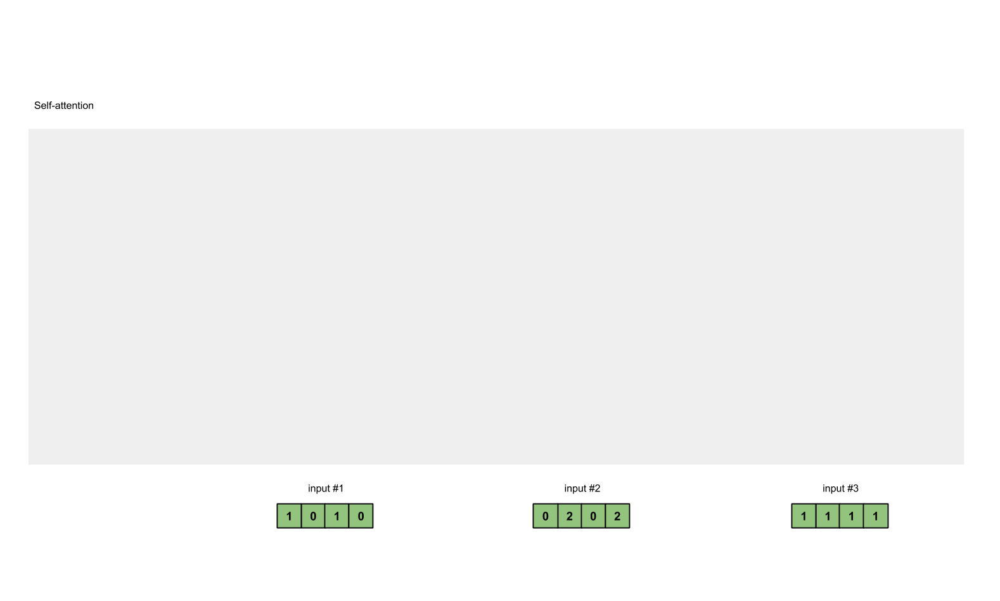(attachment:1__92bnsMJy8Bl539G4v93yg.gif)

- As the operations in transformer are parallel, the sequence order of the input data will not be considered while processing.
- A position vector must be added to the input embeddings such that embeddings follow a specific pattern that the model learns, which helps model to determine the position of each word, or the distance between words in the sequence.  
- The intuition here is that adding positional values to the embeddings provides meaningful distances between the embedding vectors once they’re projected into Q/K/V vectors.
- The attention mainly working based on weighted averages, in order to introduce non-linearity in the network, after every self attention a feed forward neural network is added.
- As the model is working in parallel, in order to hide the future states while decoding, masking is introduced in the decoder part of transformer.kk


### Transformer Applications:

- Before transformers, there were specific models utilized for specific applications, 
- for NLP- RNN or LSTMs
- for Translation- seq2seq
- for computer vision- CNN
- for speech- Deep Belief Nets 

- The transformer model was first introduced for machine translation in 2017, later on it was widely adopted to other NLP tasks such as Text Classification, Named Entity Recognition (NER), Question Answering, Language modelling, Summerization, Speech Recognition etc.

- Now, Transfomers have been extended to computer vision tasks such as image recognition and object detection, known as vision transformer (ViT).

### Vision Transformer (ViT)

- The computational efficiency and accuracy of Vision Transformer models outperform Convolutional Neural Networks (CNNs), that are currently the state-of-the-art for many computer vision applications.
- ViT is an architecture that uses multi-head self attention to process the input images.
- Each encoder consists of multi head self attention layer followed by a feed forward neural network.
- At first, the ViT architecture consists of a patch embedding layer, which divide the input image into a fixed size patches and maps each patch into a high dimensional vector space. These patch embeddings are fed into the transformer for further processing similar to NLP.
- Self attention layer calculates the attention weights for each patches of the image based on the relationship with other patches and the feed forward network applies a non-linear transformation on the attention output.
- Multi- Head attention allows to attend different part of the input sequence simultaneously.
- Finally, the output of the transformer block is fed into a fully connected classification layer based on the application.




#### Steps:
- Split image into patches
- Flatten the patches (reshape the patches from their original spatial arrangement into a sequential format).
- Convert flattened patches to low dimensional linear embeddings.
- Add positional embeddings.
- Feed the embeddings to the transformer encoder.
- Train the model with image labels.
- Use a fully connected network for classification.

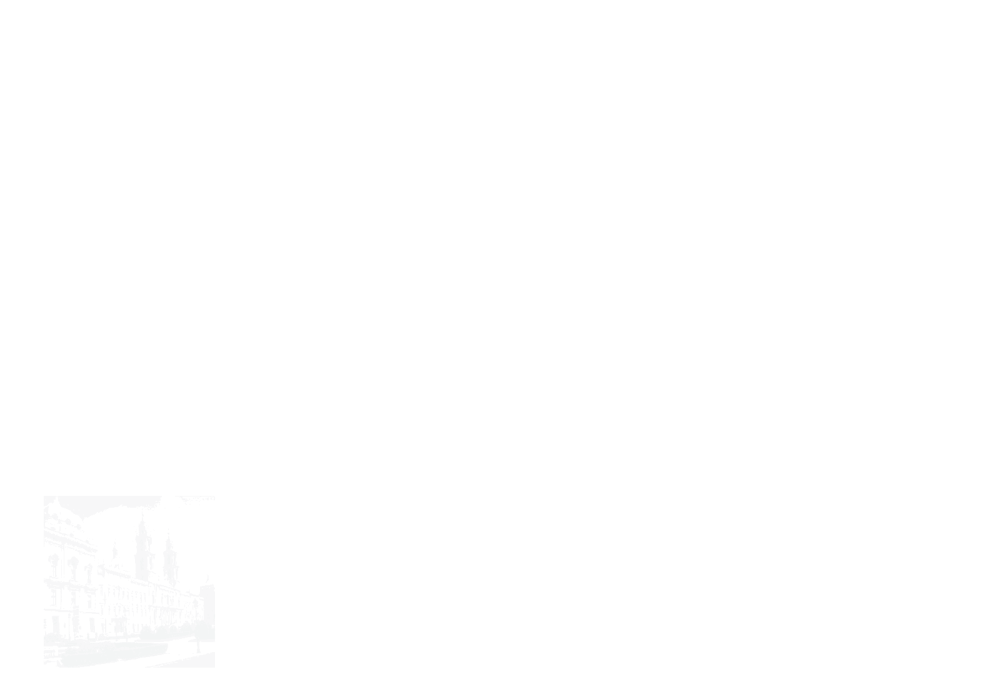
source: Google Reseacrh

### Transformer working:

#### Libraries
First, lets introduce some widely used python modules for tranformer model building.
- Tranformer library developed by Hugging Face (pip install transformers)
- Tensor2Tensor (T2T) by Google research (pip install tensor2tensor)
- PyTorch Transformers (pip install pytorch-transformers)

These libraries provide pre-trained transformer models (BERT, GPT etc.) and various resources required for working with transformers. 
- We will use PyTorch transformers in our example.
- Let's first import the libraries required for building the model.

In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

from torch import nn
from torch import Tensor
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor
from einops import rearrange, reduce, repeat
from einops.layers.torch import Rearrange, Reduce
from torchsummary import summary
import numpy as np

- Now, we need an input image to classify.

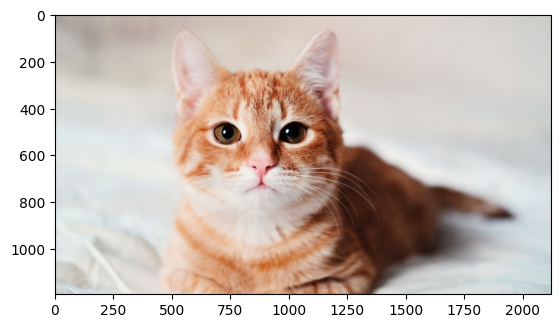

In [2]:
img = Image.open('./cat.jpg')

fig = plt.figure()
plt.imshow(img)

- The input image must be processed before passing into the deep learning model.
- Here, first resizing and converting the image into an PyTorch tensor ([batch size, channels, height, width] ) format.

In [3]:
# resize to imagenet size 
transform = Compose([Resize((224, 224)), ToTensor()])
x = transform(img)
x = x.unsqueeze(0) # add batch dim
x.shape

torch.Size([1, 3, 224, 224])

- As explained earlier, now lets split the input image into patches.
-  Now, flatten the patches by rearranging these patches into the desired combination.

In [4]:
patch_size = 16 # 16 pixels
pathes = rearrange(x, 'b c (h s1) (w s2) -> b (h w) (s1 s2 c)', s1=patch_size, s2=patch_size)
pathes.shape

torch.Size([1, 196, 768])

- The PatchEmbedding module divides the input image into patches,
- flattens each patch (into 2D vectors), 
- applies a linear transformation to obtain an embedding vector (of size 768) for each patch. 
- The output tensor has a shape that reflects the batch size, number of patches, and the embedding size.

In [5]:
class PatchEmbedding(nn.Module):
    def __init__(self, in_channels: int = 3, patch_size: int = 16, emb_size: int = 768):
        self.patch_size = patch_size
        super().__init__()
        self.projection = nn.Sequential(
            # break-down the image in s1 x s2 patches and flat them
            Rearrange('b c (h s1) (w s2) -> b (h w) (s1 s2 c)', s1=patch_size, s2=patch_size),
            nn.Linear(patch_size * patch_size * in_channels, emb_size)
        )
                
    def forward(self, x: Tensor) -> Tensor:
        x = self.projection(x)
        return x
    
PatchEmbedding()(x).shape

torch.Size([1, 196, 768])

- Inorder to have better performance, instead of linear transformation, a convolutional layer can be used to transform the input patches.

In [6]:
class PatchEmbedding(nn.Module):
    def __init__(self, in_channels: int = 3, patch_size: int = 16, emb_size: int = 768):
        self.patch_size = patch_size
        super().__init__()
        self.projection = nn.Sequential(
            # using a conv layer instead of a linear one -> performance gains
            nn.Conv2d(in_channels, emb_size, kernel_size=patch_size, stride=patch_size),
            Rearrange('b e (h) (w) -> b (h w) e'),
        )
                
    def forward(self, x: Tensor) -> Tensor:
        x = self.projection(x)
        return x
    
PatchEmbedding()(x).shape

torch.Size([1, 196, 768])

#### CLS Tocken
- Add a CLS tocken.
- CLS tocken is a tocken added as the first element in the input sequence that can carry the entire information about the input sequence after the attention operation. 
- So, CLS tocken is a learnable parameter which is initialized with random values of dimension(1,1,768)
- Each batch will be having its own cls tocken, initialized with same value.


#### Position Embedding

- Positional embedding capture the positional information of each patch in the input image.
- It is important to add the positional information of each input tocken.
- Here, the positional embedding is also considered as a learnable parameter initialized with random values (repeat(self.cls_token, '() n e -> b n e', b=b)).
- The shape of position tensor is ((img_size // patch_size) **2 + 1, emb_size)) -> (number of patches + one cls tocken, size of each embedding).
- Finally, add this positional information to the input patches.


In [7]:
class PatchEmbedding(nn.Module):
    def __init__(self, in_channels: int = 3, patch_size: int = 16, emb_size: int = 768, img_size: int = 224):
        self.patch_size = patch_size
        super().__init__()
        self.projection = nn.Sequential(
            # using a conv layer instead of a linear one -> performance gains
            nn.Conv2d(in_channels, emb_size, kernel_size=patch_size, stride=patch_size),
            Rearrange('b e (h) (w) -> b (h w) e'),
        )
        self.cls_token = nn.Parameter(torch.randn(1,1, emb_size))
        self.positions = nn.Parameter(torch.randn((img_size // patch_size) **2 + 1, emb_size))

        
    def forward(self, x: Tensor) -> Tensor:
        b, _, _, _ = x.shape
        x = self.projection(x)
        cls_tokens = repeat(self.cls_token, '() n e -> b n e', b=b)
        # prepend the cls token to the input
        x = torch.cat([cls_tokens, x], dim=1)
        # add position embedding
        x += self.positions
        return x
    
PatchEmbedding()(x).shape

torch.Size([1, 197, 768])

### Transformer Encoder

- In vision related tasks only encoder part of the transformer is enough to process the input image by capturing the relationship and dependencies between the input patches through multi-head self attention.



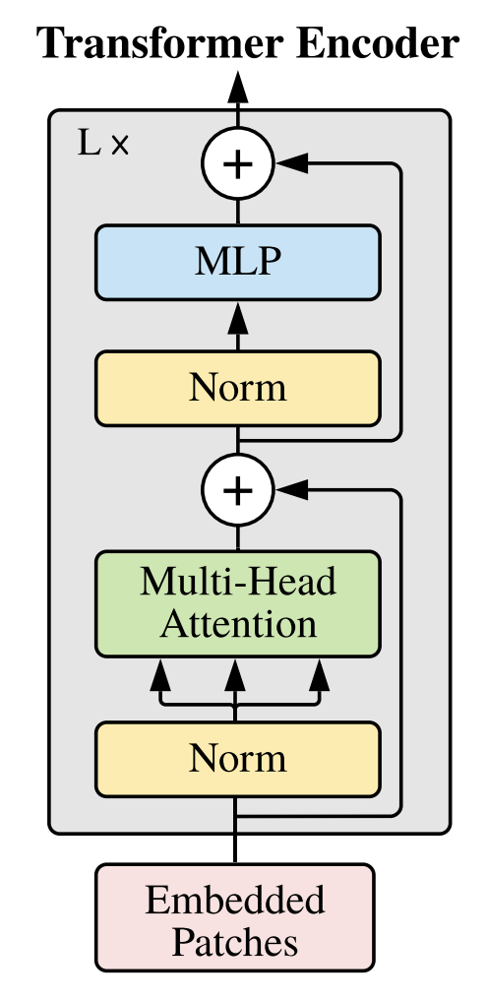 

Source: AN IMAGE IS WORTH 16X16 WORDS: TRANSFORMERS FOR IMAGE RECOGNITION AT SCALE, conference paper at ICLR 2021.

- The module takes tensor 'x' as input.
- First, initialize the MultiHeadAttention module with its parameters such as, keys, queries, values etc.
- Rearrange the queries, keys and values,  along the number of heads. 
- The einsum() performs the dot product of query and key vectors to calculate the attention score.
- Then apply softmax to the attention weights and scale it.
- Apply dropout, which is regularization technique to avoid over-fitting. Drop out is applied during training, which randomly set the values of certain attention weights to zero, which enables the model to be less sensitive to individual weights, thus improves the models generalization ability.
- Finally, multiply the attention weights to the value tensor.
  


In [8]:
class MultiHeadAttention(nn.Module):
    def __init__(self, emb_size: int = 768, num_heads: int = 8, dropout: float = 0):
        super().__init__()
        self.emb_size = emb_size
        self.num_heads = num_heads
        self.keys = nn.Linear(emb_size, emb_size)
        self.queries = nn.Linear(emb_size, emb_size)
        self.values = nn.Linear(emb_size, emb_size)
        self.att_drop = nn.Dropout(dropout)
        self.projection = nn.Linear(emb_size, emb_size)
        self.scaling = (self.emb_size // num_heads) ** -0.5

    def forward(self, x : Tensor, mask: Tensor = None) -> Tensor:
        # split keys, queries and values in num_heads
        queries = rearrange(self.queries(x), "b n (h d) -> b h n d", h=self.num_heads)
        keys = rearrange(self.keys(x), "b n (h d) -> b h n d", h=self.num_heads)
        values  = rearrange(self.values(x), "b n (h d) -> b h n d", h=self.num_heads)
        # sum up over the last axis
        energy = torch.einsum('bhqd, bhkd -> bhqk', queries, keys) # batch, num_heads, query_len, key_len
        if mask is not None:
            fill_value = torch.finfo(torch.float32).min
            energy.mask_fill(~mask, fill_value)
            
        att = F.softmax(energy, dim=-1) * self.scaling
        att = self.att_drop(att)
        # sum up over the third axis
        out = torch.einsum('bhal, bhlv -> bhav ', att, values)
        out = rearrange(out, "b h n d -> b n (h d)")
        out = self.projection(out)
        return out #,att
    
patches_embedded = PatchEmbedding()(x)
ATT_out=MultiHeadAttention()(patches_embedded)

# ATT_out[1].shape


Inorder to represent attention scores in a heat map for each head during training the below code is used.

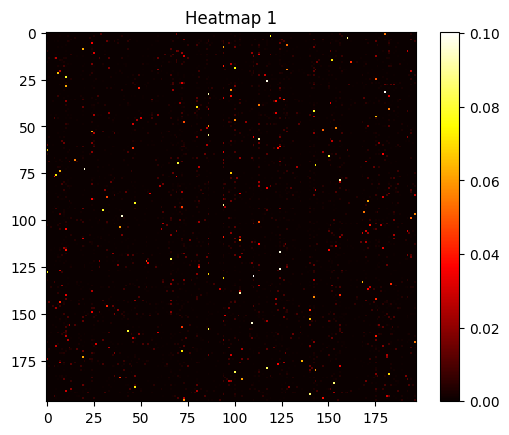

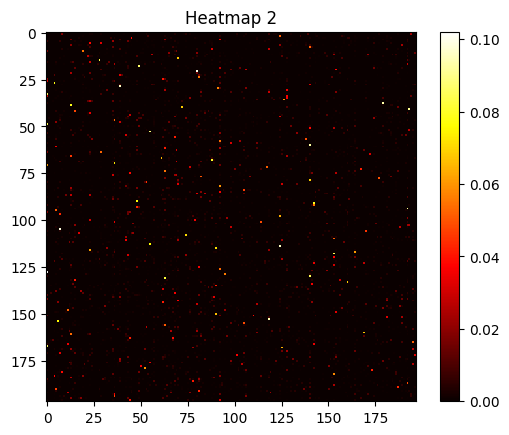

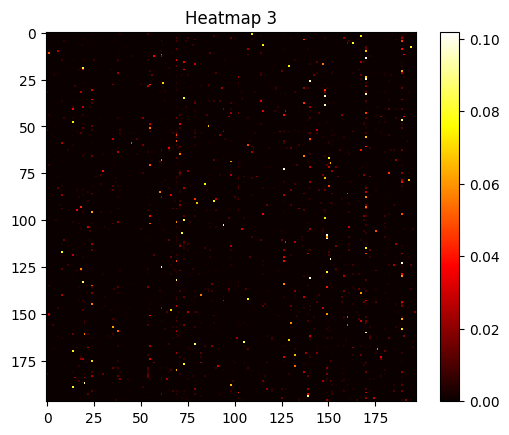

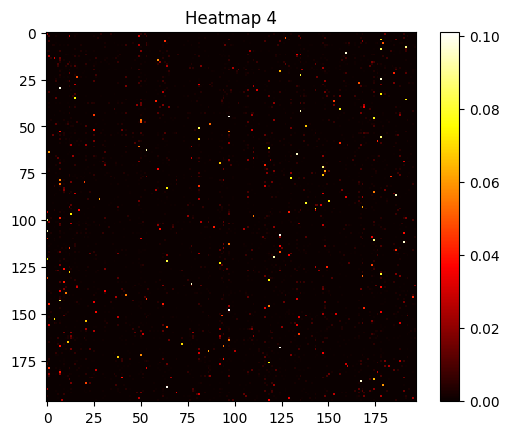

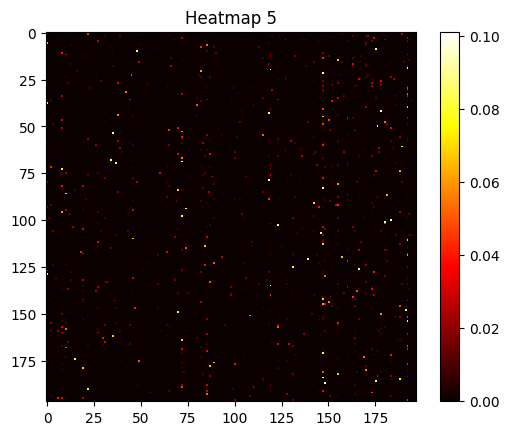

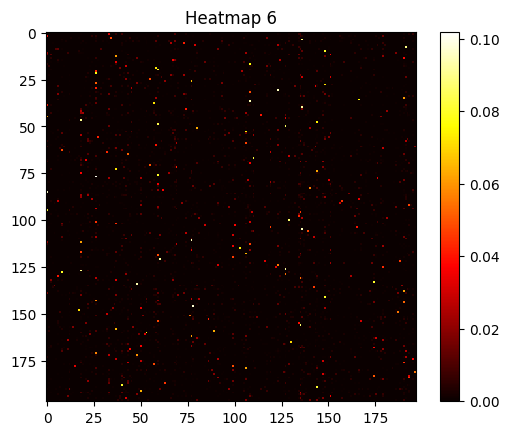

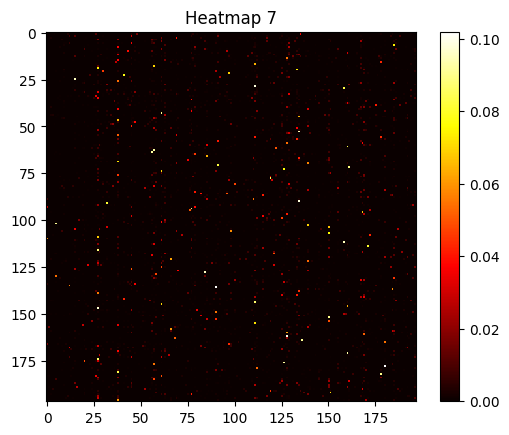

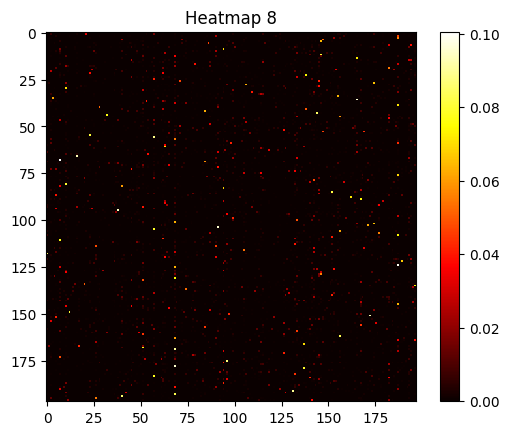

In [9]:
#model = MultiHeadAttention()
#input = PatchEmbedding()(x)

class MultiHeadAttention1(nn.Module):
    def __init__(self, emb_size: int = 768, num_heads: int = 8, dropout: float = 0):
        super().__init__()
        self.emb_size = emb_size
        self.num_heads = num_heads
        self.keys = nn.Linear(emb_size, emb_size)
        self.queries = nn.Linear(emb_size, emb_size)
        self.values = nn.Linear(emb_size, emb_size)
        self.att_drop = nn.Dropout(dropout)
        self.projection = nn.Linear(emb_size, emb_size)
        self.scaling = (self.emb_size // num_heads) ** -0.5

    def forward(self, x : Tensor, mask: Tensor = None) -> Tensor:
        # split keys, queries and values in num_heads
        queries = rearrange(self.queries(x), "b n (h d) -> b h n d", h=self.num_heads)
        keys = rearrange(self.keys(x), "b n (h d) -> b h n d", h=self.num_heads)
        values  = rearrange(self.values(x), "b n (h d) -> b h n d", h=self.num_heads)
        # sum up over the last axis
        energy = torch.einsum('bhqd, bhkd -> bhqk', queries, keys) # batch, num_heads, query_len, key_len
        if mask is not None:
            fill_value = torch.finfo(torch.float32).min
            energy.mask_fill(~mask, fill_value)
            
        att = F.softmax(energy, dim=-1) * self.scaling
        att = self.att_drop(att)
        # sum up over the third axis
        out = torch.einsum('bhal, bhlv -> bhav ', att, values)
        out = rearrange(out, "b h n d -> b n (h d)")
        out = self.projection(out)
        return out, att
    
patches_embedded = PatchEmbedding()(x)
ATT_out=MultiHeadAttention1()(patches_embedded)

# ATT_out[1].shape

tensor2 = ATT_out[1]

# Iterate over each heatmap
for i in range(tensor2.size(1)):
    heatmap = tensor2[0, i, :, :].detach().numpy()
    plt.imshow(heatmap, cmap='hot', interpolation='nearest')
    plt.title(f"Heatmap {i+1}")
    plt.colorbar()
    plt.show()

#### Adding Residuals

- Rsidual connections or skip connections aloow the data to reach the latter positions in the neural network skipping some of the layers, which can mitigate the vanishing gradient related issues.


In [10]:
class ResidualAdd(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn
        
    def forward(self, x, **kwargs):
        res = x
        x = self.fn(x, **kwargs)
        x += res
        return x

#### Feed Forward Neural Network

- The attention output is passed to two layer fully connected neural network.
- This feed forward neural networks allows the model to capture more complex relations using its non-linearity.


In [11]:
class FeedForwardBlock(nn.Sequential):
    def __init__(self, emb_size: int, expansion: int = 4, drop_p: float = 0.):
        super().__init__(
            nn.Linear(emb_size, expansion * emb_size),
            nn.GELU(),
            nn.Dropout(drop_p),
            nn.Linear(expansion * emb_size, emb_size),
        )

#### Transformer Encoder Block

In [12]:
class TransformerEncoderBlock(nn.Sequential):
    def __init__(self,
                 emb_size: int = 768,
                 drop_p: float = 0.,
                 forward_expansion: int = 4,
                 forward_drop_p: float = 0.,
                 ** kwargs):
        super().__init__(
            ResidualAdd(nn.Sequential(
                nn.LayerNorm(emb_size),
                MultiHeadAttention(emb_size, **kwargs),
                nn.Dropout(drop_p)
            )),
            ResidualAdd(nn.Sequential(
                nn.LayerNorm(emb_size),
                FeedForwardBlock(
                    emb_size, expansion=forward_expansion, drop_p=forward_drop_p),
                nn.Dropout(drop_p)
            )
            ))

In [13]:
class TransformerEncoder(nn.Sequential):
    def __init__(self, depth: int = 12, **kwargs):
        super().__init__(*[TransformerEncoderBlock(**kwargs) for _ in range(depth)])
                

#### Classifier

In [14]:
class ClassificationHead(nn.Sequential):
    def __init__(self, emb_size: int = 768, n_classes: int = 1000):
        super().__init__(
            Reduce('b n e -> b e', reduction='mean'),
            nn.LayerNorm(emb_size), 
            nn.Linear(emb_size, n_classes))

## ViT Transformer

In [15]:
class ViT(nn.Sequential):
    def __init__(self,     
                in_channels: int = 3,
                patch_size: int = 16,
                emb_size: int = 768,
                img_size: int = 224,
                depth: int = 12,
                n_classes: int = 1000,
                **kwargs):
        super().__init__(
            PatchEmbedding(in_channels, patch_size, emb_size, img_size),
            TransformerEncoder(depth, emb_size=emb_size, **kwargs),
            ClassificationHead(emb_size, n_classes)
        )
        

In [16]:
summary(ViT(),(3, 224, 224), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 768, 14, 14]         590,592
         Rearrange-2             [-1, 196, 768]               0
    PatchEmbedding-3             [-1, 197, 768]               0
         LayerNorm-4             [-1, 197, 768]           1,536
            Linear-5             [-1, 197, 768]         590,592
            Linear-6             [-1, 197, 768]         590,592
            Linear-7             [-1, 197, 768]         590,592
           Dropout-8          [-1, 8, 197, 197]               0
            Linear-9             [-1, 197, 768]         590,592
MultiHeadAttention-10             [-1, 197, 768]               0
          Dropout-11             [-1, 197, 768]               0
      ResidualAdd-12             [-1, 197, 768]               0
        LayerNorm-13             [-1, 197, 768]           1,536
           Linear-14            [-1, 1

- The above explanation gives an idea of building a Vision Transformer model.
- Inorder to classify the inputs, the model requires training.
- Therefore, lets make use of the pre trained models in the pytorch library to understand the capability of transformer models.

### Example Program
-Now, Lets utilize the pre-trained models in the pytorch library to classify the input image.

In [17]:
from torchvision.models import ViT_B_32_Weights,vit_b_32
trans_model = vit_b_32(weights=ViT_B_32_Weights.DEFAULT).eval()
# Step 2: Initialize the inference transforms
preprocess = ViT_B_32_Weights.DEFAULT.transforms()
class_names = ViT_B_32_Weights.DEFAULT.meta["categories"]
import PIL.Image as Image
img = Image.open('cat.jpg').convert('RGB')
# Step 3: Apply inference preprocessing transforms
batch = preprocess(img).unsqueeze(0)
# Step 4: Use the model and print the predicted category
prediction = trans_model(batch).squeeze(0).softmax(0)
class_id = prediction.argmax().item()
score = prediction[class_id].item()
category_name = class_names[class_id]
print(f"{category_name}: {100 * score:.1f}%")

Egyptian cat: 31.2%


- The pretrained ViT model predicts the input image correctly (cat). 
- Now, lets try another pretrained model available in Pytorch (ViT_L_32).

In [18]:
from torchvision.models import ViT_L_32_Weights,vit_l_32
trans_model = vit_l_32(weights=ViT_L_32_Weights.DEFAULT).eval()
# Step 2: Initialize the inference transforms
preprocess = ViT_L_32_Weights.DEFAULT.transforms()
class_names = ViT_L_32_Weights.DEFAULT.meta["categories"]
import PIL.Image as Image
img = Image.open('cat.jpg').convert('RGB')
# Step 3: Apply inference preprocessing transforms
batch = preprocess(img).unsqueeze(0)
# Step 4: Use the model and print the predicted category
prediction = trans_model(batch).squeeze(0).softmax(0)
class_id = prediction.argmax().item()
score = prediction[class_id].item()
category_name = class_names[class_id]
print(f"{category_name}: {100 * score:.1f}%")



tiger cat: 27.7%


In [19]:
trans_model

VisionTransformer(
  (conv_proj): Conv2d(3, 1024, kernel_size=(32, 32), stride=(32, 32))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=1024, out_features=4096, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=4096, out_features=1024, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
       

In [20]:
attention_scores = []
for module in trans_model.modules():
    if isinstance(module, nn.MultiheadAttention):
        attention_scores.append(module.attn_output)

# Print the attention scores
for i, attn in enumerate(attention_scores):
    print(f"Attention scores for self-attention layer {i+1}:")
    print(attn)
    print()

AttributeError: 'MultiheadAttention' object has no attribute 'attn_output'